In [ ]:
!pip install -U -q "tensorflow>=2.9.2" "tf-models-official"

In [ ]:
import os
import pprint
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

from IPython import display

from PIL import Image

from sklearn.model_selection import train_test_split

import tensorflow as tf

import orbit
import tensorflow_models as tfm
from official.vision.data import tfrecord_lib
from official.vision.serving import export_saved_model_lib
from official.vision.utils.object_detection import visualization_utils

pp = pprint.PrettyPrinter(indent=4) # Set Pretty Print Indentation
print(tf.__version__) # Check the version of tensorflow used

tf.get_logger().setLevel('INFO')

%matplotlib inline

2.15.0


In [ ]:
base_folder = "aeroscapes"

train_file_set = os.path.join(base_folder, "ImageSets/trn.txt")
val_file_set = os.path.join(base_folder, "ImageSets/val.txt")

train_file_paths = np.loadtxt(train_file_set, dtype=str)
val_file_paths = np.loadtxt(val_file_set, dtype=str)

all_file_paths = np.concatenate((train_file_paths, val_file_paths))

train_file_paths, test_val_file_paths = train_test_split(all_file_paths)
val_file_paths, test_file_paths = train_test_split(test_val_file_paths, train_size=0.5)

# Define the paths to the image and label folders
image_folder = "JPEGImages"
mask_folder = "SegmentationClass"

# Get the list of file paths in each folder
train_image_file_paths = [os.path.join(base_folder, image_folder, filename) for filename in train_file_paths]
train_mask_file_paths = [os.path.join(base_folder, mask_folder, filename) for filename in train_file_paths]

val_image_file_paths = [os.path.join(base_folder, image_folder, filename) for filename in val_file_paths]
val_mask_file_paths = [os.path.join(base_folder, mask_folder, filename) for filename in val_file_paths]

test_image_file_paths = [os.path.join(base_folder, image_folder, filename) for filename in test_file_paths]
test_mask_file_paths = [os.path.join(base_folder, mask_folder, filename) for filename in test_file_paths]

In [ ]:
train_len = len(train_file_paths)
val_len = len(val_file_paths)
test_len = len(test_file_paths)

print(f"Train Lenght : {train_len} \nVal Lenght : {val_len} \nTest Lenght : {test_len}")

Train Lenght : 2451 
Val Lenght : 409 
Test Lenght : 409


In [ ]:
from PIL import Image
import tensorflow as tf
import numpy as np

class ImageMaskGenerator(tf.keras.utils.Sequence):
    def __init__(self, image_paths, mask_paths, num_classes, batch_size=32, image_size=(256, 256)):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.num_classes = num_classes
        self.batch_size = batch_size
        self.image_size = image_size
        self.indexes = np.arange(len(self.image_paths))

    def generate(self):
        for i in self.indexes:
            image_path = self.image_paths[i]
            mask_path = self.mask_paths[i]
            image = self.load_image(image_path)
            mask = self.load_mask(mask_path)
            yield image, mask

    def __len__(self):
        # Calculate the number of batches
        return int(np.ceil(len(self.image_paths) / self.batch_size))

    def __getitem__(self, index):
        # Get batch of images and masks
        start_idx = index * self.batch_size
        end_idx = (index + 1) * self.batch_size

        batch_image_paths = self.image_paths[start_idx:end_idx]
        batch_mask_paths = self.mask_paths[start_idx:end_idx]

        images = [self.load_image(path) for path in batch_image_paths]
        masks = [self.load_mask(path) for path in batch_mask_paths]

        return np.array(images), np.array(masks)

    def load_image(self, path):
        # Load and preprocess images
        path = path + '.jpg'
        with Image.open(path) as img:
            img = img.resize(self.image_size)
            # img = np.array(img) / 255.0  # Normalize to [0, 1]
        return img

    def load_mask(self, path):
        # Load and preprocess masks
        path = path + '.png'
        with Image.open(path) as mask:
            mask = mask.resize(self.image_size, resample=Image.NEAREST)
            mask = np.array(mask)
            mask = np.expand_dims(mask, axis=-1)
        return mask

    def compute_class_weights(self):
        # Count occurrences of each class in the dataset
        class_counts = np.zeros(self.num_classes)
        total_samples = 0

        for mask_path in self.mask_paths:
            mask_path = mask_path + '.png'
            mask = np.array(Image.open(mask_path).resize(self.image_size, resample=Image.NEAREST))
            class_indices, counts = np.unique(mask, return_counts=True)
            class_counts[class_indices] += counts
            total_samples += np.sum(counts)

        # Compute class weights using inverse class frequency
        class_weights = total_samples / (self.num_classes * class_counts)

        return class_weights

In [ ]:
def preprocess_data(image, mask) :
  return {
      'image' : image,
      'segmentation_mask' : mask
  }

In [ ]:
def get_preprocess_dataset_from_generator(generator) :
  dataset = tf.data.Dataset.from_generator(
    generator.generate,
    output_signature=(
        tf.TensorSpec(shape=(256, 256, 3), dtype=tf.uint8),
        tf.TensorSpec(shape=(256, 256, 1), dtype=tf.uint8)
    ))
  dataset = (
    dataset
    .map(preprocess_data)
    .prefetch(buffer_size=tf.data.AUTOTUNE)
    )
  return dataset


In [ ]:
num_classes = 12
batch_size = 32
buffer_size = 1000

train_generator = ImageMaskGenerator(train_image_file_paths, train_mask_file_paths, num_classes=num_classes, batch_size=batch_size)
val_generator = ImageMaskGenerator(val_image_file_paths, val_mask_file_paths, num_classes=num_classes, batch_size=batch_size)
test_generator = ImageMaskGenerator(test_image_file_paths, test_mask_file_paths, num_classes=num_classes, batch_size=batch_size)

train_dataset = get_preprocess_dataset_from_generator(train_generator)
val_dataset = get_preprocess_dataset_from_generator(val_generator)
test_dataset = get_preprocess_dataset_from_generator(test_generator)

In [ ]:
from official.vision.data import tfrecord_lib

def process_record(record):
  keys_to_features = {
  'image/encoded': tfrecord_lib.convert_to_feature(
      tf.io.encode_jpeg(record['image']).numpy()),
  'image/height': tfrecord_lib.convert_to_feature(record['image'].shape[0]),
  'image/width': tfrecord_lib.convert_to_feature(record['image'].shape[1]),
  'image/segmentation/class/encoded':tfrecord_lib.convert_to_feature(
      tf.io.encode_png(record['segmentation_mask']).numpy())
  }
  example = tf.train.Example(
      features=tf.train.Features(feature=keys_to_features))
  return example

In [ ]:
output_dir = './aeroscapes_tfrecords/'
LOG_EVERY = 100
if not os.path.exists(output_dir):
  os.mkdir(output_dir)

def write_tfrecords(dataset, output_path, num_shards=1):
  writers = [
        tf.io.TFRecordWriter(
            output_path + '-%05d-of-%05d.tfrecord' % (i, num_shards))
        for i in range(num_shards)
    ]
  for idx, record in enumerate(dataset):
    if idx % LOG_EVERY == 0:
      print('On image %d', idx)
    tf_example = process_record(record)
    writers[idx % num_shards].write(tf_example.SerializeToString())

In [ ]:
output_train_tfrecs = output_dir + 'train'
write_tfrecords(train_dataset, output_train_tfrecs, num_shards=10)

On image %d 0
On image %d 100
On image %d 200
On image %d 300
On image %d 400
On image %d 500
On image %d 600
On image %d 700
On image %d 800
On image %d 900
On image %d 1000
On image %d 1100
On image %d 1200
On image %d 1300
On image %d 1400
On image %d 1500
On image %d 1600
On image %d 1700
On image %d 1800
On image %d 1900
On image %d 2000
On image %d 2100
On image %d 2200
On image %d 2300
On image %d 2400


In [ ]:
output_val_tfrecs = output_dir + 'val'
write_tfrecords(val_dataset, output_val_tfrecs, num_shards=5)

On image %d 0
On image %d 100
On image %d 200
On image %d 300
On image %d 400


In [ ]:
output_test_tfrecs = output_dir + 'test'
write_tfrecords(test_dataset, output_test_tfrecs, num_shards=5)

On image %d 0
On image %d 100
On image %d 200
On image %d 300
On image %d 400


In [ ]:
train_data_tfrecords = output_train_tfrecs + '*'
val_data_tfrecords = output_val_tfrecs + '*'
test_data_tfrecords = output_test_tfrecs + '*'
trained_model = './trained_model/'
export_dir = './exported_model/'

In [ ]:
import tensorflow_models as tfm
exp_config = tfm.core.exp_factory.get_exp_config('mnv2_deeplabv3_pascal')

In [ ]:
model_ckpt_path = './model_ckpt/'
if not os.path.exists(model_ckpt_path):
  os.mkdir(model_ckpt_path)

!gsutil cp gs://tf_model_garden/cloud/vision-2.0/deeplab/deeplabv3_mobilenetv2_coco/best_ckpt-63.data-00000-of-00001 './model_ckpt/'
!gsutil cp gs://tf_model_garden/cloud/vision-2.0/deeplab/deeplabv3_mobilenetv2_coco/best_ckpt-63.index './model_ckpt/'

Copying gs://tf_model_garden/cloud/vision-2.0/deeplab/deeplabv3_mobilenetv2_coco/best_ckpt-63.data-00000-of-00001...
| [1 files][ 28.2 MiB/ 28.2 MiB]                                                
Operation completed over 1 objects/28.2 MiB.                                     
Copying gs://tf_model_garden/cloud/vision-2.0/deeplab/deeplabv3_mobilenetv2_coco/best_ckpt-63.index...
/ [1 files][ 12.5 KiB/ 12.5 KiB]                                                
Operation completed over 1 objects/12.5 KiB.                                     


In [ ]:
class_weights = train_generator.compute_class_weights()

In [ ]:
num_classes = 12
WIDTH, HEIGHT = 256, 256
input_size = [HEIGHT, WIDTH, 3]
BATCH_SIZE = 32

# Backbone Config
exp_config.task.init_checkpoint = model_ckpt_path + 'best_ckpt-63'
exp_config.task.freeze_backbone = False

# Model Config
exp_config.task.model.num_classes = num_classes
exp_config.task.model.input_size = input_size

# Training Data Config
exp_config.task.train_data.aug_scale_min = 1.0
exp_config.task.train_data.aug_scale_max = 1.0
exp_config.task.train_data.input_path = train_data_tfrecords
exp_config.task.train_data.global_batch_size = BATCH_SIZE
exp_config.task.train_data.dtype = 'float32'
exp_config.task.train_data.output_size = [HEIGHT, WIDTH]
exp_config.task.train_data.preserve_aspect_ratio = False
exp_config.task.train_data.seed = 21 # Reproducable Training Data

# Validation Data Config
exp_config.task.validation_data.input_path = val_data_tfrecords
exp_config.task.validation_data.global_batch_size = BATCH_SIZE
exp_config.task.validation_data.dtype = 'float32'
exp_config.task.validation_data.output_size = [HEIGHT, WIDTH]
exp_config.task.validation_data.preserve_aspect_ratio = False
exp_config.task.validation_data.groundtruth_padded_size = [HEIGHT, WIDTH]
exp_config.task.validation_data.seed = 21 # Reproducable Validation Data

# exp_config.task.losses.class_weights = list(class_weights)

In [ ]:
logical_device_names = [logical_device.name
                        for logical_device in tf.config.list_logical_devices()]

if 'GPU' in ''.join(logical_device_names):
  print('This may be broken in Colab.')
  device = 'GPU'
elif 'TPU' in ''.join(logical_device_names):
  print('This may be broken in Colab.')
  device = 'TPU'
else:
  print('Running on CPU is slow, so only train for a few steps.')
  device = 'CPU'


train_steps = 2000
exp_config.trainer.steps_per_loop = int(train_len // BATCH_SIZE)

exp_config.trainer.summary_interval = exp_config.trainer.steps_per_loop # steps_per_loop = num_of_validation_examples // eval_batch_size
exp_config.trainer.checkpoint_interval = exp_config.trainer.steps_per_loop
exp_config.trainer.validation_interval = exp_config.trainer.steps_per_loop
exp_config.trainer.validation_steps =  int(val_len // BATCH_SIZE) # validation_steps = num_of_validation_examples // eval_batch_size
exp_config.trainer.train_steps = train_steps
exp_config.trainer.optimizer_config.warmup.linear.warmup_steps = exp_config.trainer.steps_per_loop
exp_config.trainer.optimizer_config.learning_rate.type = 'cosine'
exp_config.trainer.optimizer_config.learning_rate.cosine.decay_steps = train_steps
exp_config.trainer.optimizer_config.learning_rate.cosine.initial_learning_rate = 0.1
exp_config.trainer.optimizer_config.warmup.linear.warmup_learning_rate = 0.05

This may be broken in Colab.


In [ ]:
from IPython import display
pp.pprint(exp_config.as_dict())
display.Javascript('google.colab.output.setIframeHeight("500px");')

{   'runtime': {   'all_reduce_alg': None,
                   'batchnorm_spatial_persistent': False,
                   'dataset_num_private_threads': None,
                   'default_shard_dim': -1,
                   'distribution_strategy': 'mirrored',
                   'enable_xla': False,
                   'gpu_thread_mode': None,
                   'loss_scale': None,
                   'mixed_precision_dtype': None,
                   'num_cores_per_replica': 1,
                   'num_gpus': 0,
                   'num_packs': 1,
                   'per_gpu_thread_count': 0,
                   'run_eagerly': False,
                   'task_index': -1,
                   'tpu': None,
                   'tpu_enable_xla_dynamic_padder': None,
                   'use_tpu_mp_strategy': False,
                   'worker_hosts': None},
    'task': {   'allow_image_summary': True,
                'differential_privacy_config': None,
                'eval_input_partition_dims': [],
  

<IPython.core.display.Javascript object>

In [ ]:
# Setting up the Strategy
if exp_config.runtime.mixed_precision_dtype == tf.float16:
    tf.keras.mixed_precision.set_global_policy('mixed_float16')

if 'GPU' in ''.join(logical_device_names):
  distribution_strategy = tf.distribute.MirroredStrategy()
elif 'TPU' in ''.join(logical_device_names):
  tf.tpu.experimental.initialize_tpu_system()
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='/device:TPU_SYSTEM:0')
  distribution_strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
  print('Warning: this will be really slow.')
  distribution_strategy = tf.distribute.OneDeviceStrategy(logical_device_names[0])

print("Done")

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)


Done


In [ ]:
model_dir = './trained_model/'

with distribution_strategy.scope():
  task = tfm.core.task_factory.get_task(exp_config.task, logging_dir=model_dir)

In [ ]:
for images, masks in task.build_inputs(exp_config.task.train_data).take(1):
  print()
  print(f'images.shape: {str(images.shape):16}  images.dtype: {images.dtype!r}')
  print(f'masks.shape: {str(masks["masks"].shape):16} images.dtype: {masks["masks"].dtype!r}')


images.shape: (32, 256, 256, 3)  images.dtype: tf.float32
masks.shape: (32, 256, 256, 1) images.dtype: tf.float32


In [ ]:
colors = [np.random.randint(256, size=3) / 255.0 for i in range(num_classes)]
cmap = mpl.colors.ListedColormap(colors)
def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.utils.array_to_img(display_list[i]), cmap=cmap)


    plt.axis('off')
  plt.show()

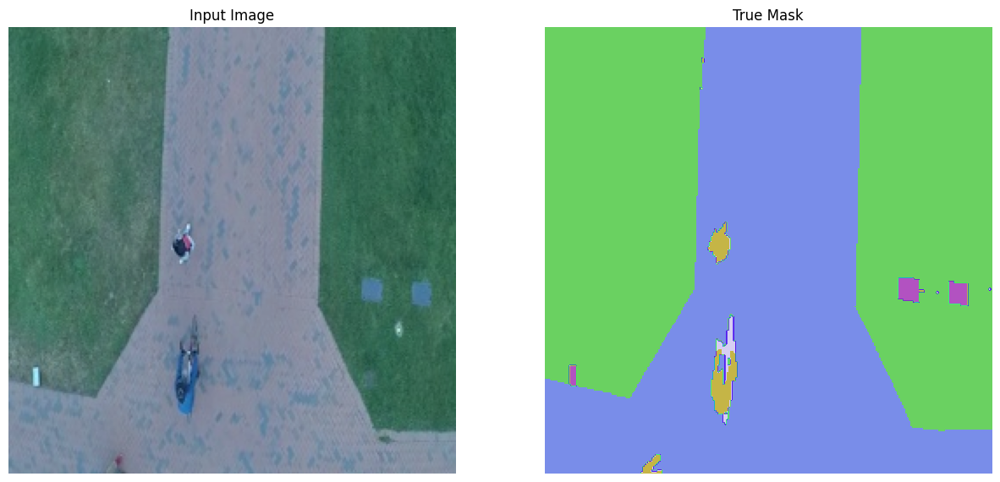

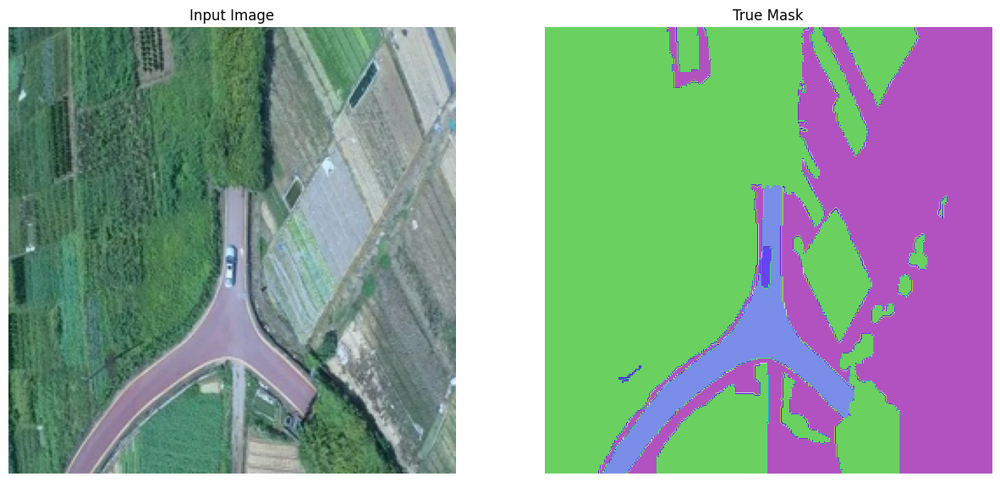

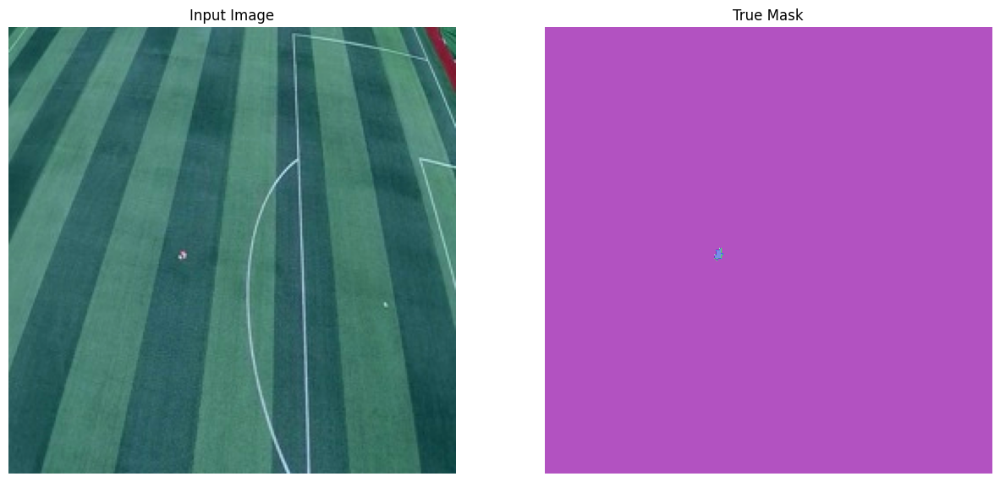

In [ ]:
num_examples = 3

for images, masks in task.build_inputs(exp_config.task.train_data).take(num_examples):
  display([images[0], masks['masks'][0]])

In [ ]:
model, eval_logs = tfm.core.train_lib.run_experiment(
    distribution_strategy=distribution_strategy,
    task=task,
    mode='train',
    params=exp_config,
    model_dir=model_dir,
    run_post_eval=False)

INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Redu

restoring or initializing model...


INFO:tensorflow:Customized initialization is done through the passed `init_fn`.


train | step:      0 | training until step 2000...


train | step:     76 | steps/sec:    1.2 | output: {'learning_rate': 0.09964413, 'mean_iou': 0.27568278, 'training_loss': 0.62103}
saved checkpoint to ./trained_model/ckpt-76.
train | step:    152 | steps/sec:    2.6 | output: 
    {'learning_rate': 0.09858159,
     'mean_iou': 0.34778714,
     'training_loss': 0.43373063}
saved checkpoint to ./trained_model/ckpt-152.
train | step:    228 | steps/sec:    2.7 | output: 
    {'learning_rate': 0.0968275,
     'mean_iou': 0.38163576,
     'training_loss': 0.37342188}
saved checkpoint to ./trained_model/ckpt-228.
train | step:    304 | steps/sec:    2.7 | output: 
    {'learning_rate': 0.09440682,
     'mean_iou': 0.41565084,
     'training_loss': 0.30256084}
saved checkpoint to ./trained_model/ckpt-304.
train | step:    380 | steps/sec:    2.5 | output: 
    {'learning_rate': 0.091354035,
     'mean_iou': 0.44315767,
     'training_loss': 0.2706144}
saved checkpoint to ./trained_model/ckpt-380.
train | step:    456 | steps/sec:    2.6 | ou

In [ ]:
%load_ext tensorboard
%tensorboard --logdir './trained_model'

<IPython.core.display.Javascript object>

In [ ]:
export_saved_model_lib.export_inference_graph(
    input_type='image_tensor',
    batch_size=1,
    input_image_size=[HEIGHT, WIDTH],
    params=exp_config,
    checkpoint_path=tf.train.latest_checkpoint(model_dir),
    export_dir=export_dir)

In [ ]:
imported = tf.saved_model.load(export_dir)
model_fn = imported.signatures['serving_default']

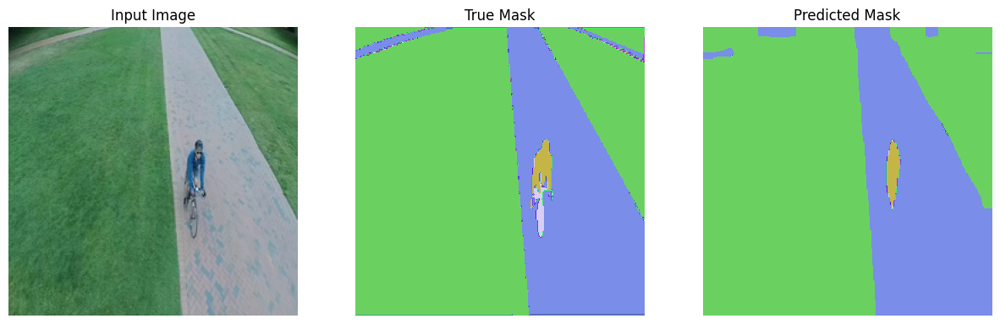

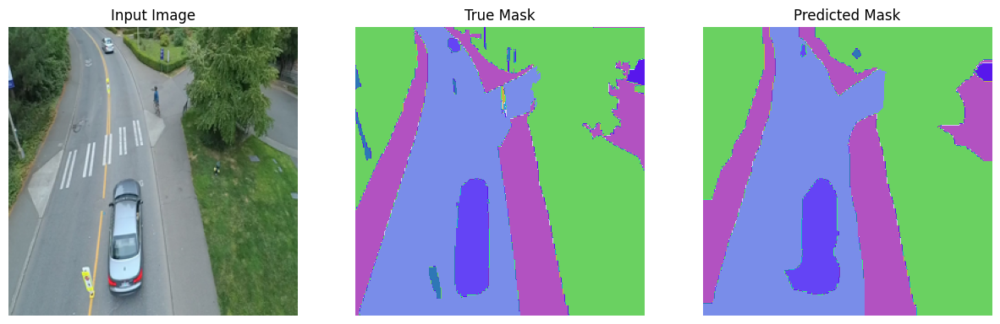

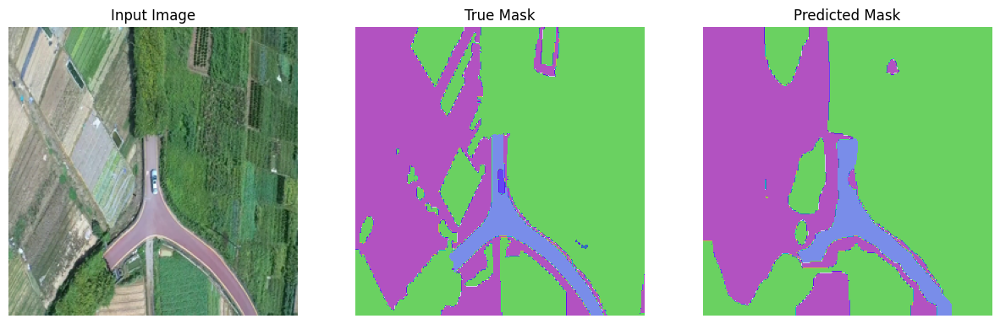

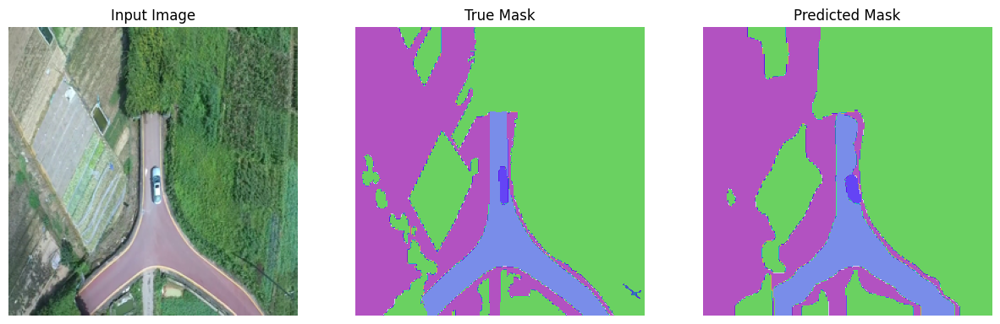

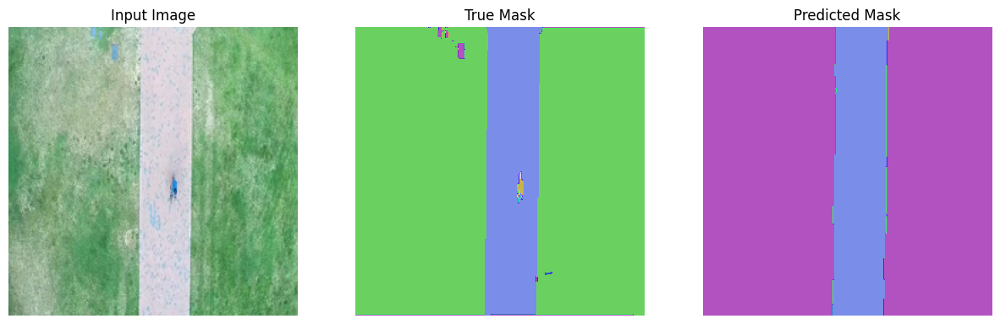

...

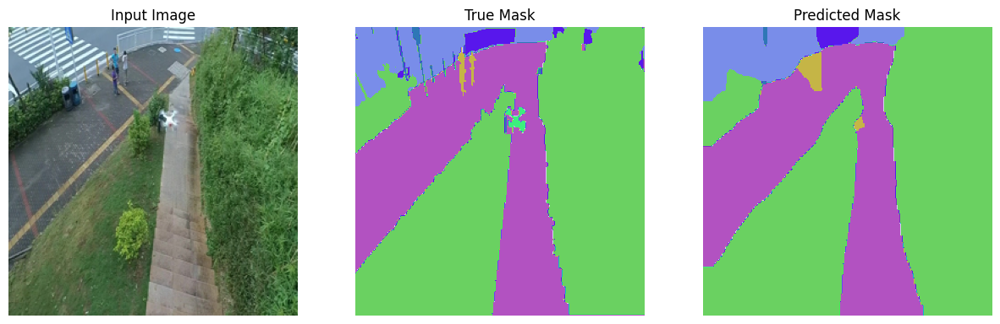

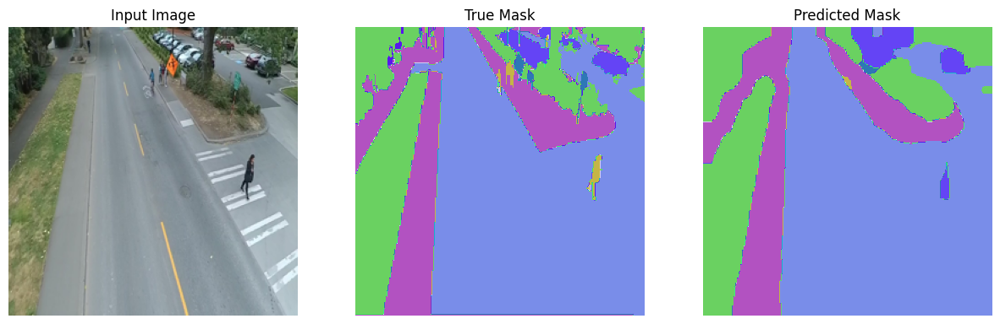

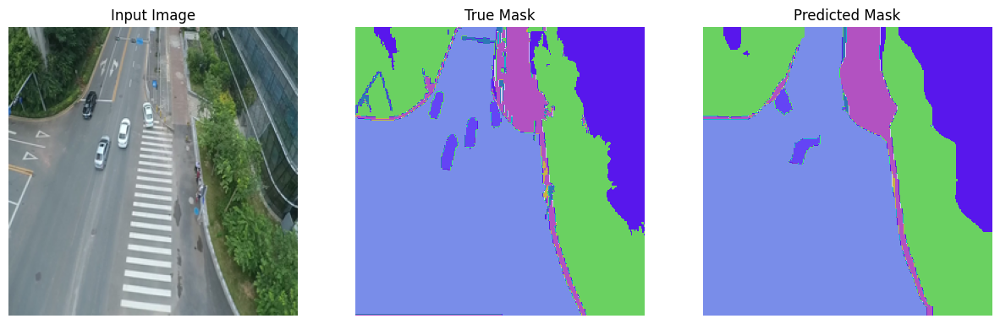

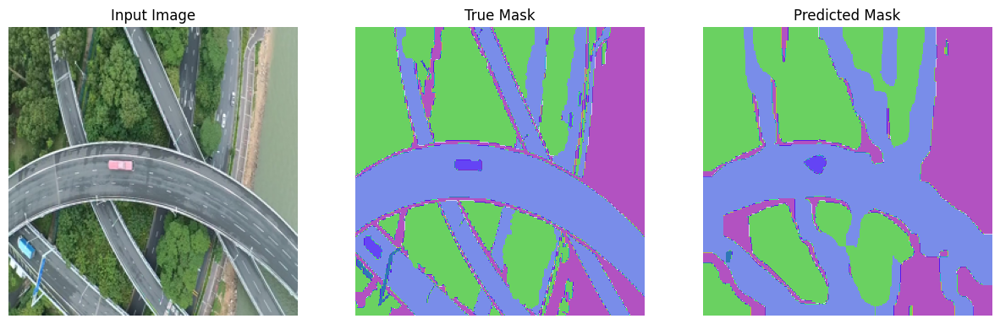

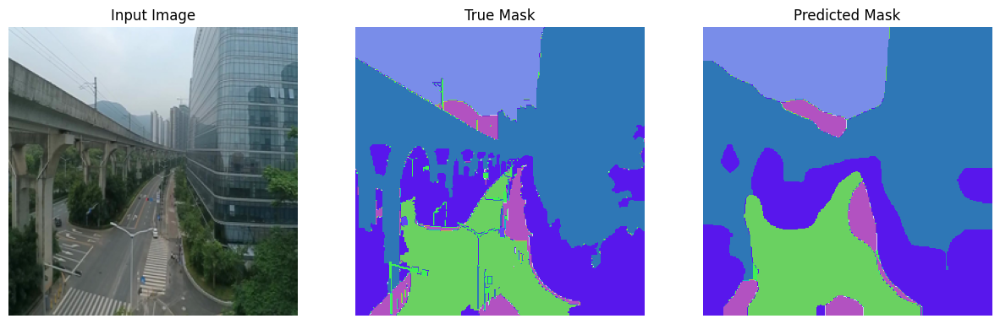

In [ ]:
# without class weight

def create_mask(pred_mask):
  pred_mask = tf.math.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]


for record in test_dataset.take(15):
  image = tf.image.resize(record['image'], size=[HEIGHT, WIDTH])
  image = tf.cast(image, dtype=tf.uint8)
  mask = tf.image.resize(record['segmentation_mask'], size=[HEIGHT, WIDTH])
  predicted_mask = model_fn(tf.expand_dims(record['image'], axis=0))
  display([image, mask, create_mask(predicted_mask['logits'])])